All the imports and drive mount

In [ ]:
!pip install datasets --quiet

from huggingface_hub import login
from google.colab import userdata

import os
import json

from datasets import load_dataset

from google.colab import drive, files

import torch
import torch.nn as nn
from torchvision import transforms

import cv2

import numpy as np

from PIL import Image

import math

from skimage.metrics import structural_similarity as ssim

import matplotlib.pyplot as plt

from moviepy.editor import VideoFileClip

In [ ]:
# Mount the drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Get the fine video files

In [ ]:
# Login to hugging face with access token
login(userdata.get('HF_TOKEN'))

# Load FineVideo dataset
dataset = load_dataset("HuggingFaceFV/finevideo", split="train", streaming=True)

Resolving data files:   0%|          | 0/1357 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/1357 [00:00<?, ?it/s]

In [ ]:
desired_category = 'Art Exhibitions'

# Filter samples by category
def is_desired_category(sample):
    return sample['json']['content_fine_category'] == desired_category

filtered_dataset = filter(is_desired_category, dataset)

os.makedirs("/content/drive/MyDrive/videos", exist_ok=True)
os.makedirs("/content/drive/MyDrive/metadata", exist_ok=True)

for idx, sample in enumerate(filtered_dataset):
    if idx >= 100:
        break

    video_filename = f"/content/drive/MyDrive/videos/sample_{idx}.mp4"
    with open(video_filename, 'wb') as video_file:
        video_file.write(sample['mp4'])

    json_filename = f"/content/drive/MyDrive/metadata/sample_{idx}.json"
    with open(json_filename, 'w') as json_file:
        json.dump(sample['json'], json_file)

Extract chosen frames from the video

In [ ]:
video = files.upload() # No idea how to supply video better

Saving TenZorroSample2.mp4 to TenZorroSample2.mp4


In [ ]:
def extract_significant_frames(video_path, threshold=0.4, resize_to=(320, 180)):
    cap = cv2.VideoCapture(video_path)

    # Bendras kadrų skaičius
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print("Total frames: " + str(total_frames))

    # Kadrai per sekundę
    fps = cap.get(cv2.CAP_PROP_FPS)
    print("FPS: " + str(fps))

    # Bendra įrašo trukmė sekundėmis
    total_duration_sec = total_frames / fps
    print("Total duration: " + str(total_duration_sec) + " seconds.")

    # Nustatyti, kas kiek kadrų tikrinti pagal video trukmę
    check_every_n_frames = max(1, int(fps * total_duration_sec / 60))
    print("Check every " + str(check_every_n_frames) + " frames.")
    print("Frames to be checked: " + str(math.floor(total_frames / check_every_n_frames)))

    frames = []
    timestamps = []
    prev_gray = None
    frame_index = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_index % check_every_n_frames != 0:
          frame_index += 1
          continue

        small = cv2.resize(frame, resize_to)
        gray = cv2.cvtColor(small, cv2.COLOR_BGR2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        current_time_sec = cap.get(cv2.CAP_PROP_POS_MSEC) / 1000.0
        timestamp = current_time_sec

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image_pil = Image.fromarray(frame_rgb)

        if prev_gray is None:
            prev_gray = gray
            frames.append(image_pil)
            timestamps.append(timestamp)
        else:
            similarity = ssim(prev_gray, gray)
            if similarity < threshold:
                prev_gray = gray
                frames.append(image_pil)
                timestamps.append(timestamp)

        frame_index += 1

    cap.release()
    return frames, timestamps


In [ ]:
video_path = "sample_40.mp4"  # failo pavadinimas

frames, timestamps = extract_significant_frames(video_path)
print("Selected frame count: " + str(len(frames)))

Total frames: 1309
FPS: 29.97002997002997
Total duration: 43.676966666666665 seconds.
Check every 21 frames.
Frames to be checked: 62
Selected frame count: 29


0


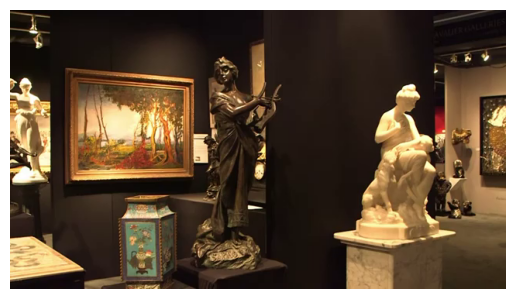

1


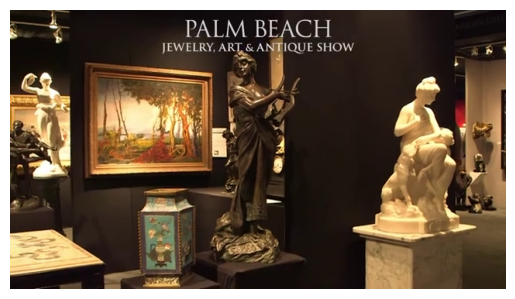

2


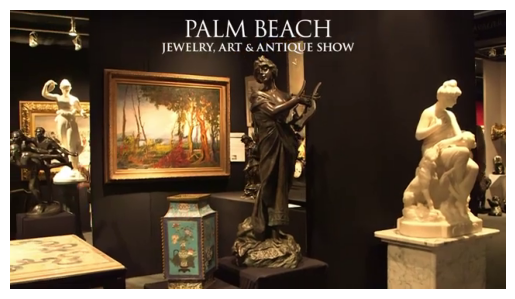

3


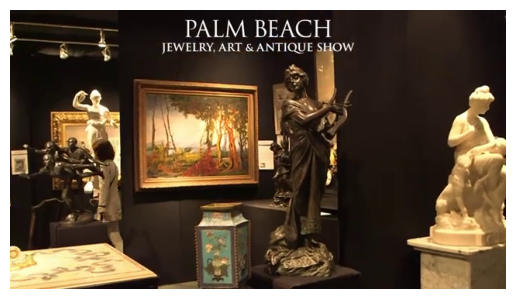

4


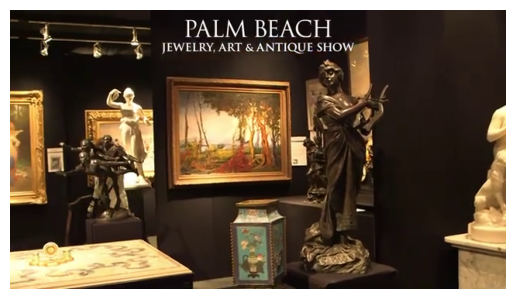

5


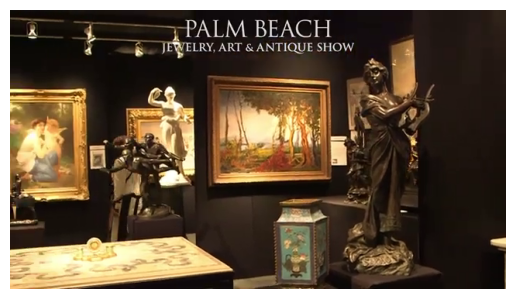

6


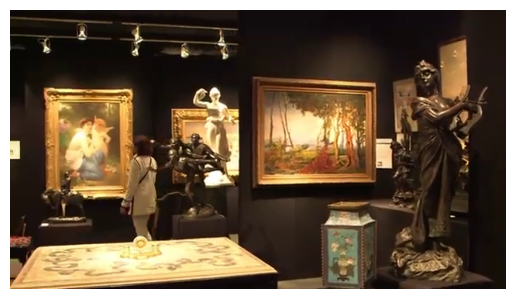

7


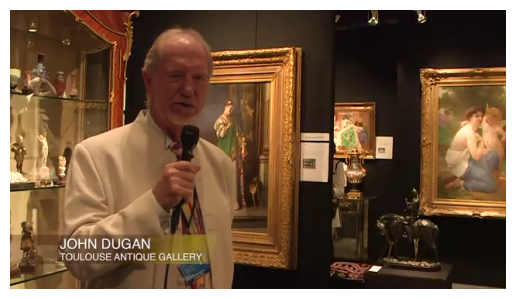

8


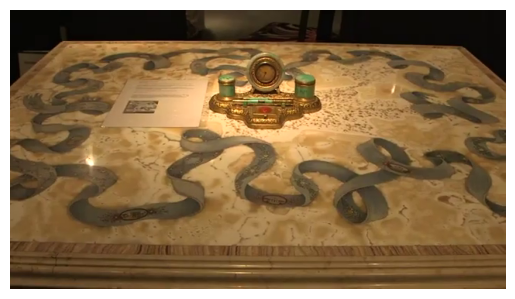

9


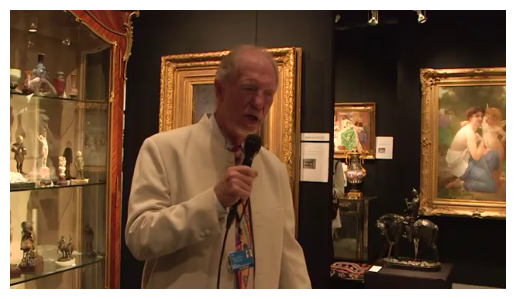

10


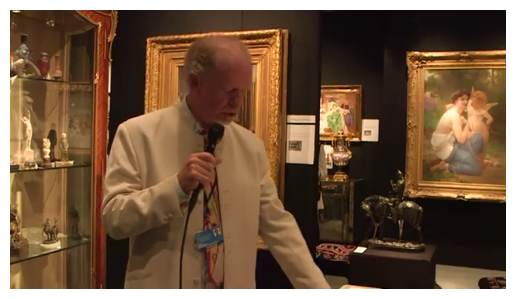

11


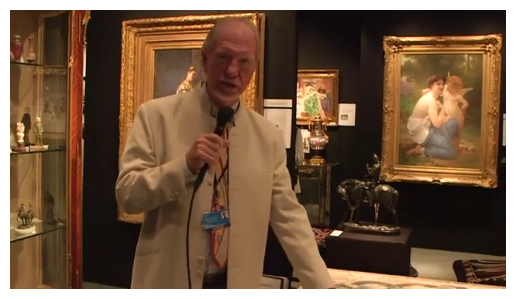

12


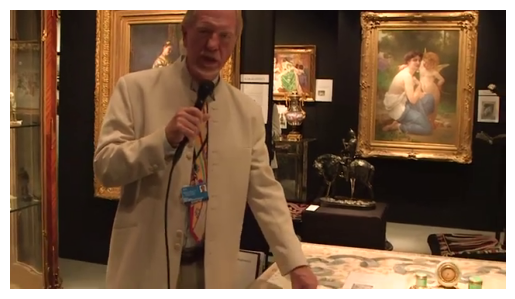

13


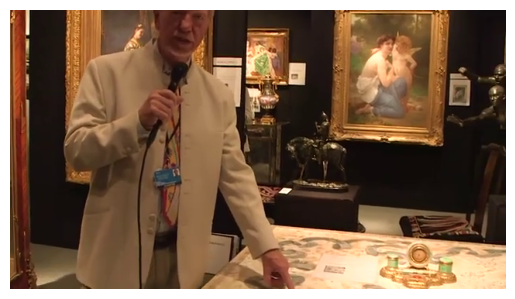

14


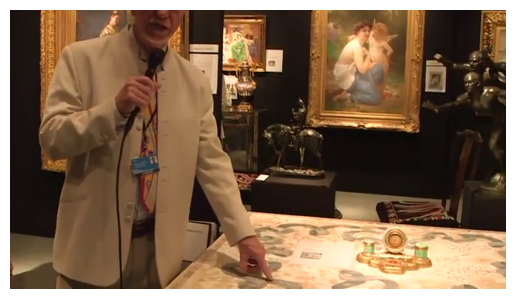

15


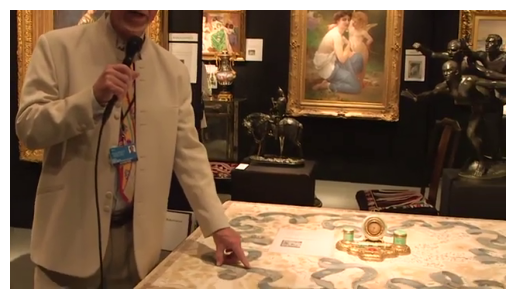

16


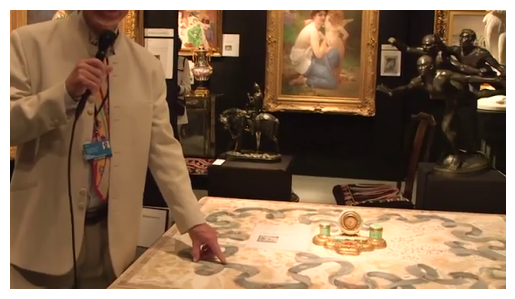

17


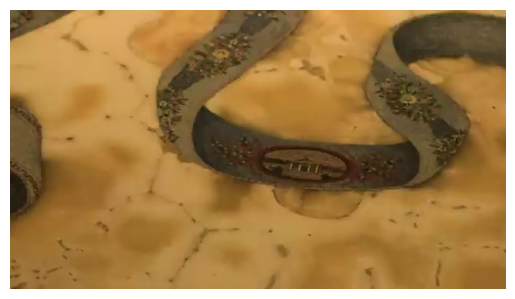

18


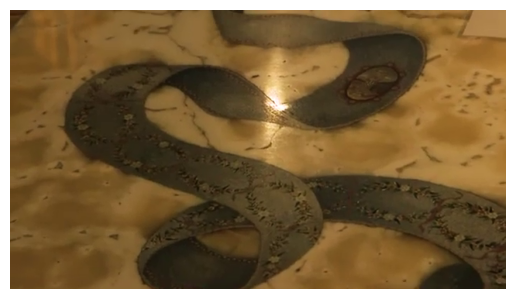

19


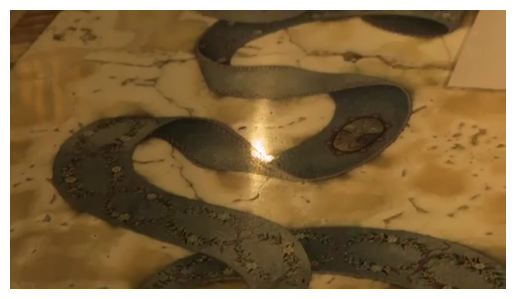

20


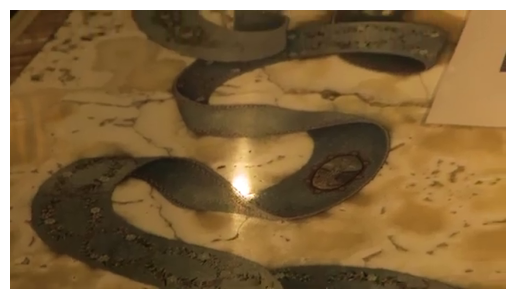

21


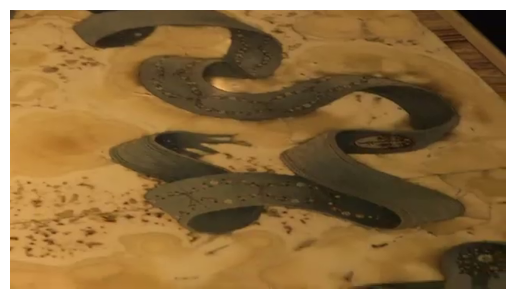

22


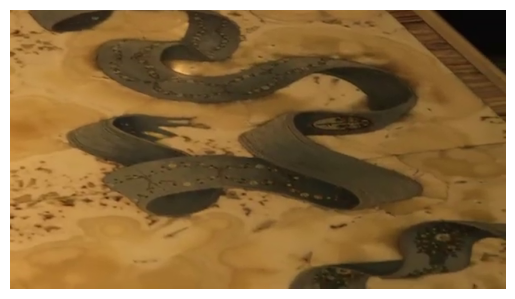

23


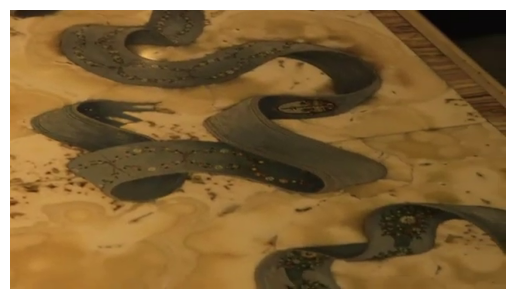

24


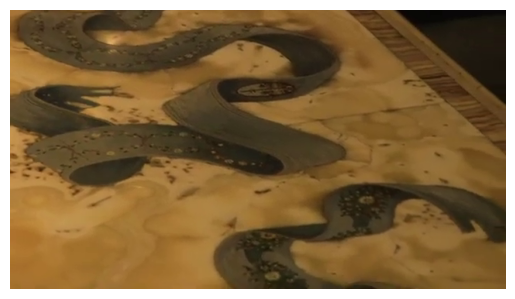

25


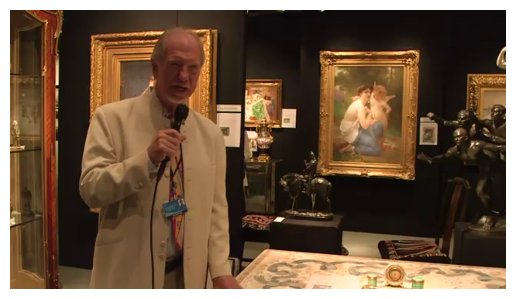

26


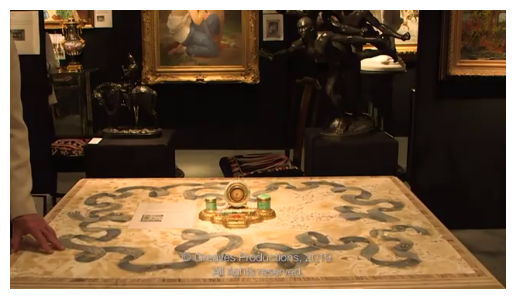

27


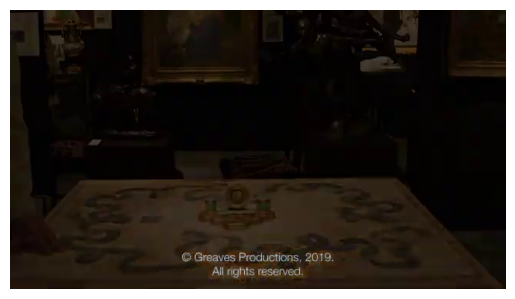

28


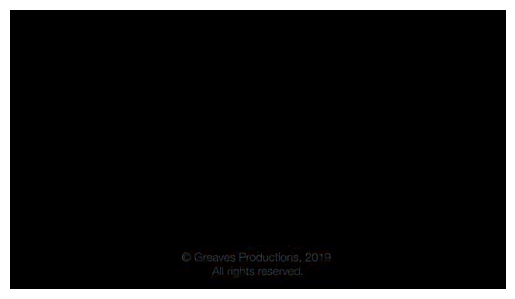

In [ ]:
# Display the chosen frames

for frame in frames:
  print(frames.index(frame))
  plt.imshow(frame)
  plt.axis('off')
  plt.show()

Segment the chosen frames

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Down, self).__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels)
        else:
            self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # Pad x1 to have the same spatial dimensions as x2
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [ ]:
import torchvision.models.segmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
segmentation_model_path = "/content/drive/MyDrive/UNET model/model_epoch_30.pth"

segmentation_model = UNet(3, 1).to(device)
segmentation_model.load_state_dict(torch.load(segmentation_model_path, map_location=device))

<All keys matched successfully>

In [ ]:
segmentation_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

In [ ]:
resized_frames = torch.stack([segmentation_transform(frame) for frame in frames]).to(device)
with torch.no_grad():
  outputs = segmentation_model(resized_frames)
  preds = torch.sigmoid(outputs)

segmented_masks = []
for pred in preds:
  mask = pred.squeeze().cpu().numpy()
  mask = (mask > 0.5).astype(np.uint8) * 255

  _, thresh = cv2.threshold(mask, 150, 255, cv2.THRESH_BINARY)
  img = Image.fromarray(thresh).convert('L')
  segmented_masks.append(img)


In [ ]:
outputs.shape

torch.Size([29, 1, 256, 256])

0


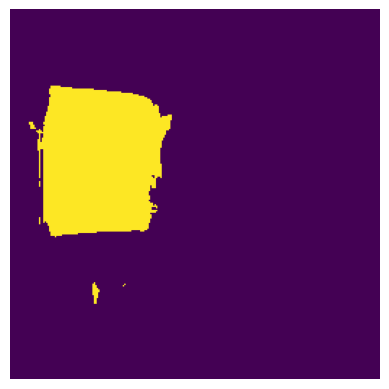

1


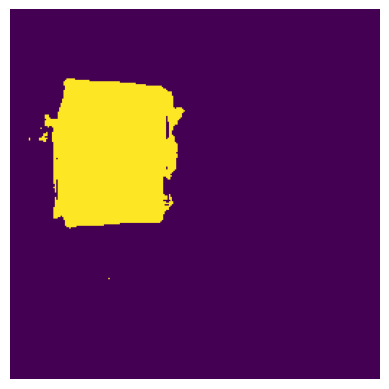

2


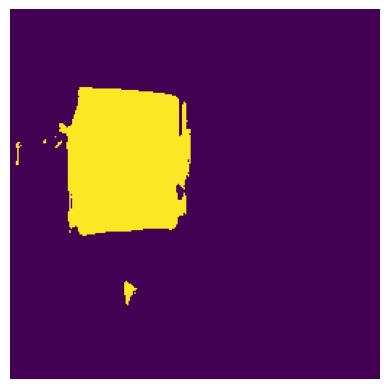

3


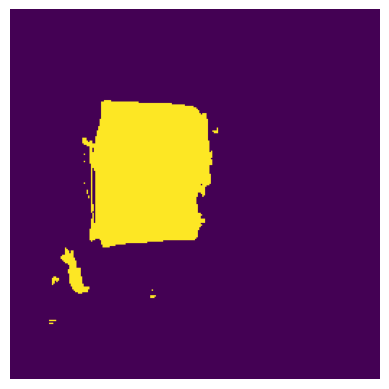

4


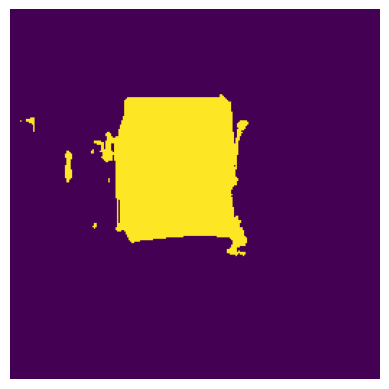

5


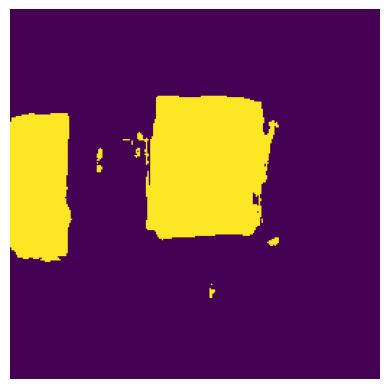

6


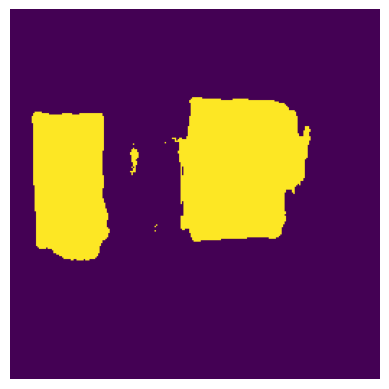

7


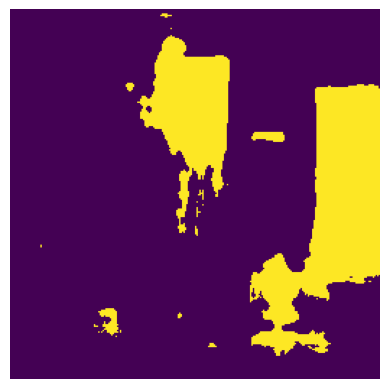

8


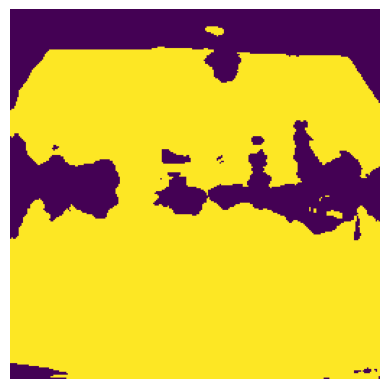

9


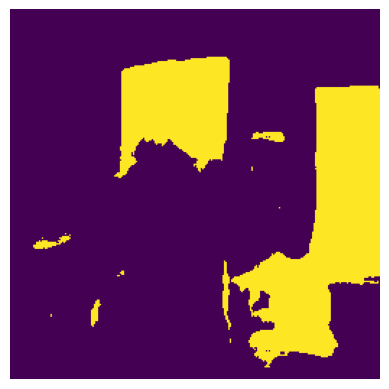

10


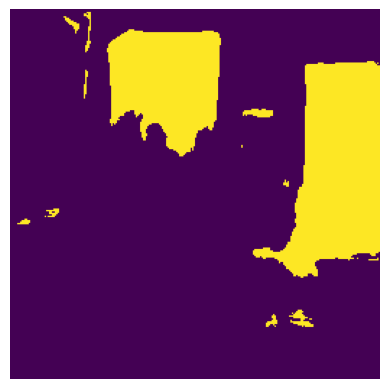

11


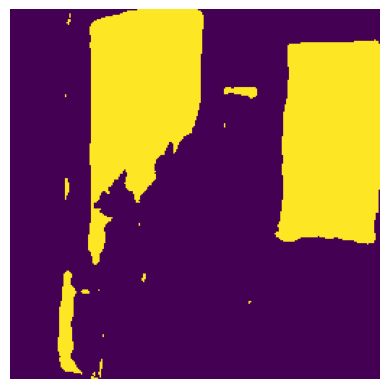

12


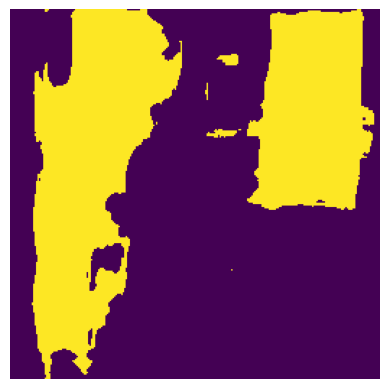

13


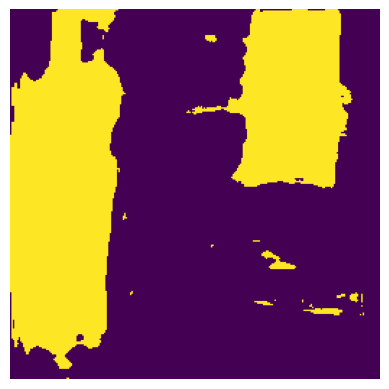

14


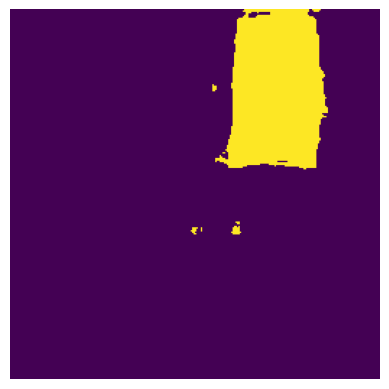

15


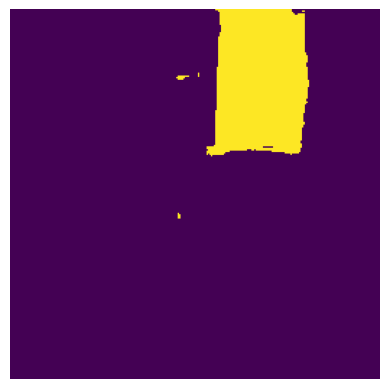

16


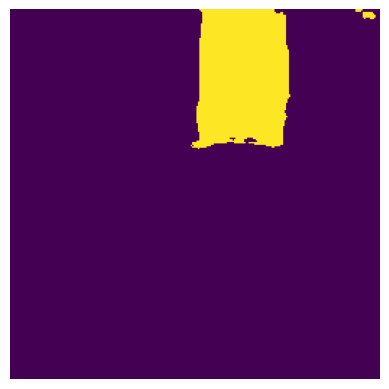

17


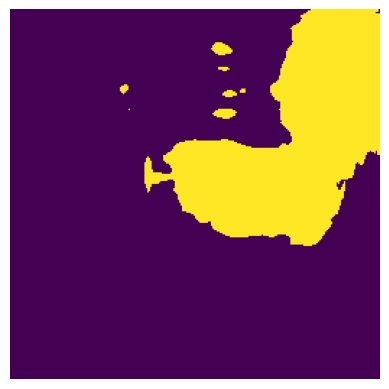

18


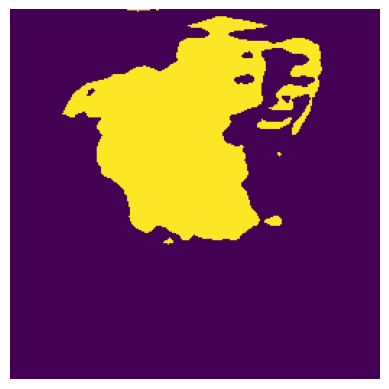

19


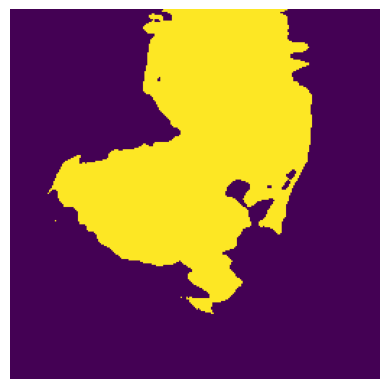

20


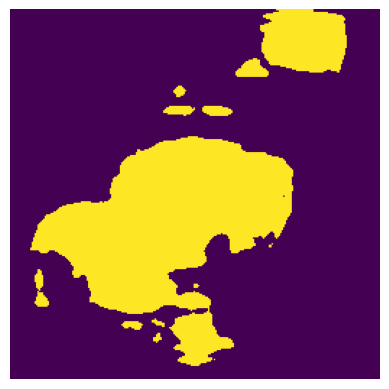

21


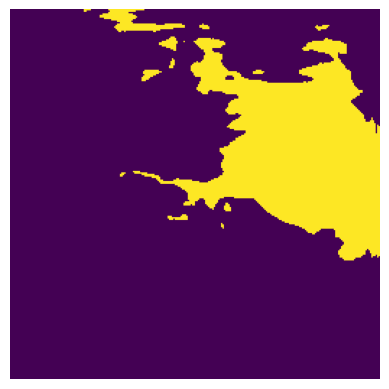

22


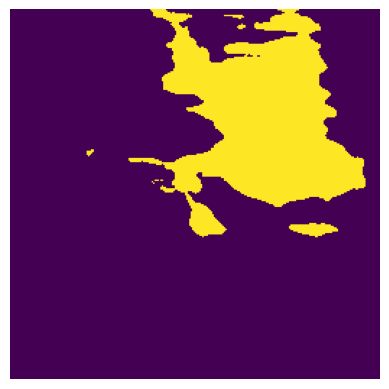

23


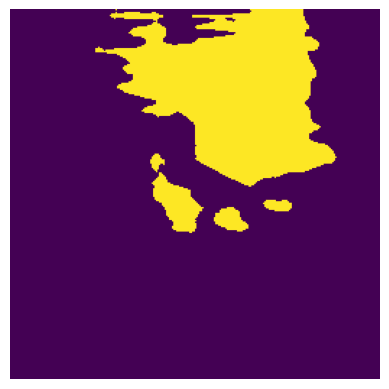

24


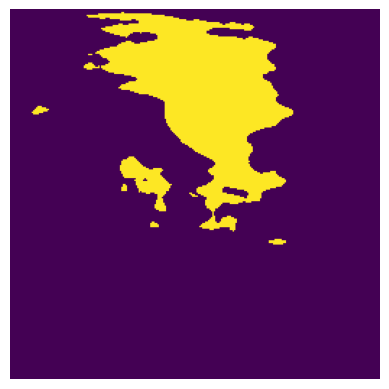

25


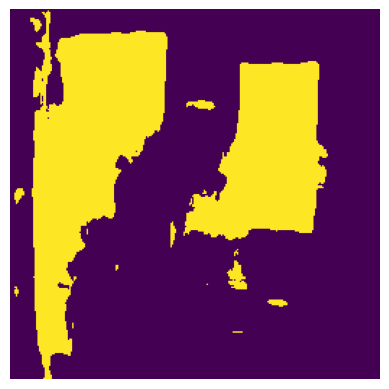

26


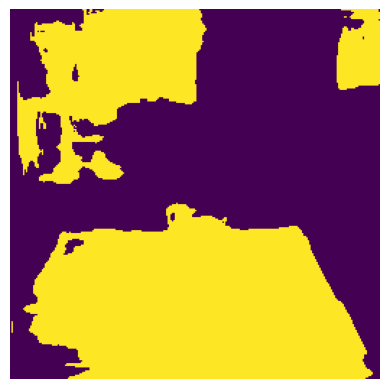

27


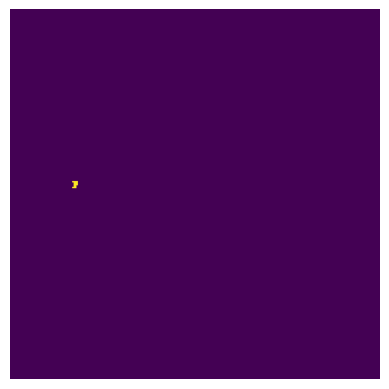

28


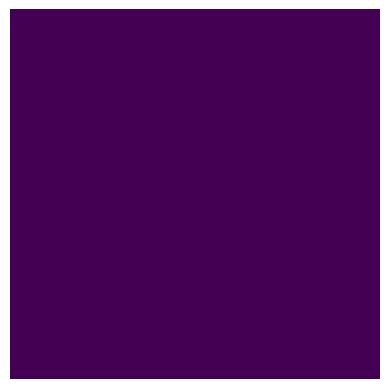

In [ ]:
for mask in segmented_masks:
  print(segmented_masks.index(mask))
  plt.imshow(mask)
  plt.axis('off')
  plt.show()

Divide the segmented images into several parts, each containing an image

In [ ]:
def extract_segments(image_pil, mask_pil, min_area=600, output_size=(256, 256)):
    """
    Extracts and returns segmented object crops from a PIL image based on its binary mask.

    Args:
        image_pil (PIL.Image): Original image.
        mask_pil (PIL.Image): Binary segmentation mask (grayscale).
        min_area (int): Minimum area to keep a segment.
        output_size (tuple): Output size (H, W) for each segment.

    Returns:
        List[PIL.Image]: List of cropped, resized segments as PIL images.
    """
    # Transform (resize)
    image_pil = transforms.ToTensor()(image_pil)
    resize_transform = transforms.Resize((len(image_pil[0]), len(image_pil[0][0])))
    output_resize_transform = transforms.Resize(output_size)

    # Convert images to numpy arrays
    image_np = np.array(resize_transform(transforms.ToPILImage()(image_pil.cpu())))
    mask_tensor = transforms.ToTensor()(mask_pil)  # shape: [1, H, W]
    mask_np = resize_transform(mask_tensor).squeeze(0).numpy()
    mask_np = (mask_np > 0).astype(np.uint8)

    # Get connected components
    num_labels, labels = cv2.connectedComponents(mask_np)

    segments = []
    painting_coordinates = [];

    for label_id in range(1, num_labels):
        object_mask = (labels == label_id).astype(np.uint8) * 255
        contours, _ = cv2.findContours(object_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for cont in contours:
            if cv2.contourArea(cont) < min_area:
                continue

            x, y, w, h = cv2.boundingRect(cont)
            painting_coordinates.append((x, y, w, h))
            cropped = image_np[y:y+h, x:x+w]

            # Convert to PIL and resize
            pil_crop = Image.fromarray(cropped)
            resized_crop = output_resize_transform(pil_crop)
            segments.append(resized_crop)

    return segments, painting_coordinates

In [ ]:
all_segments = []
all_painting_coordinates = []
for i in range(len(frames)):
  frame_width, frame_height = frames[i].size
  segments, painting_coordinates = extract_segments(frames[i], segmented_masks[i], min_area=(frame_width * frame_height / 200))
  if len(segments) > 0:
    segments_tensors = [transforms.ToTensor()(segment) for segment in segments]
    all_segments.append(torch.stack(segments_tensors))
    all_painting_coordinates.append(painting_coordinates)
  else:
    all_segments.append(torch.empty(0))
    all_painting_coordinates.append(torch.empty(0))

Displaying frame: 0


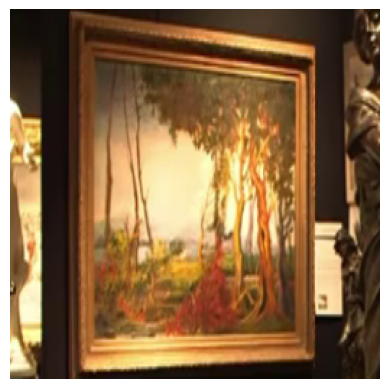

Displaying frame: 1


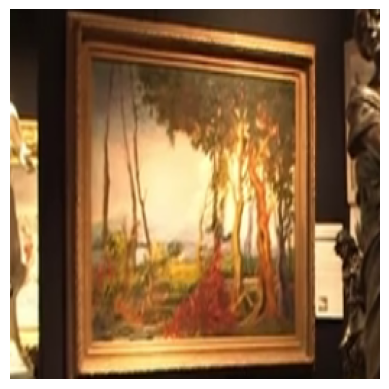

Displaying frame: 2


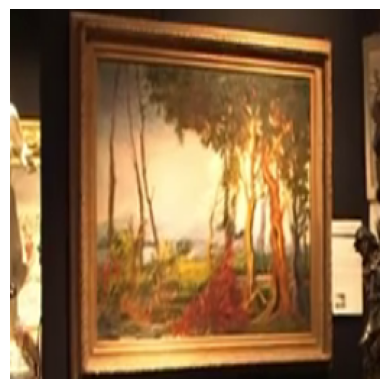

Displaying frame: 3


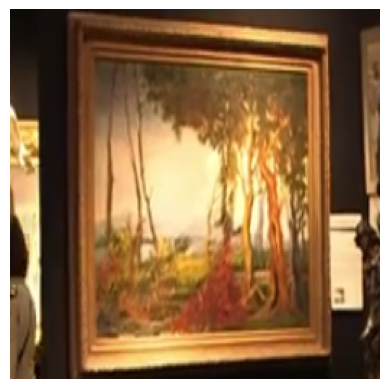

Displaying frame: 4


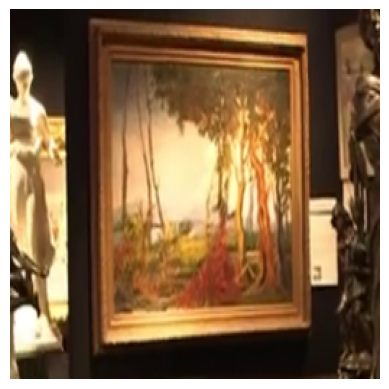

Displaying frame: 5


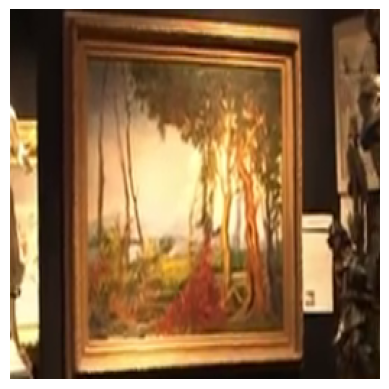

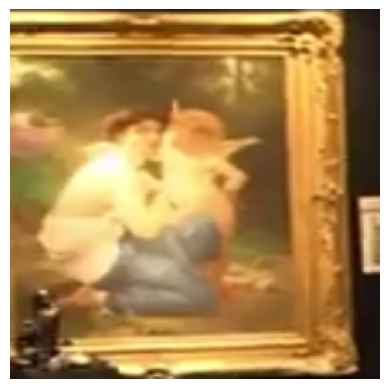

Displaying frame: 6


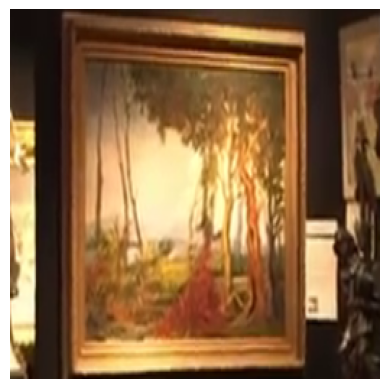

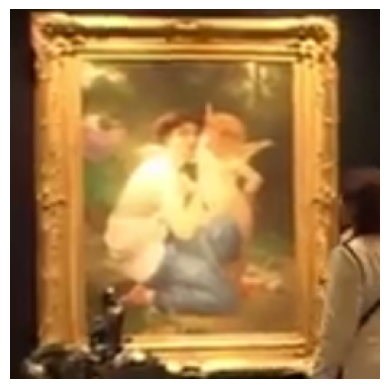

Displaying frame: 7


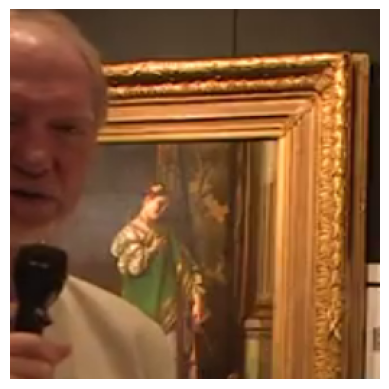

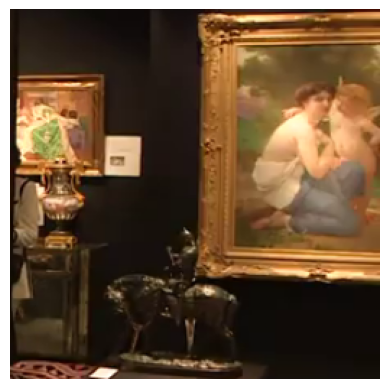

Displaying frame: 8


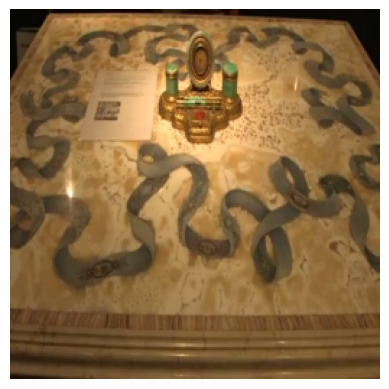

Displaying frame: 9


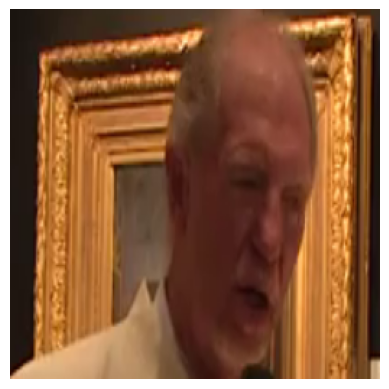

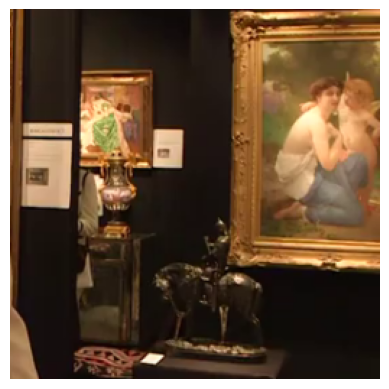

Displaying frame: 10


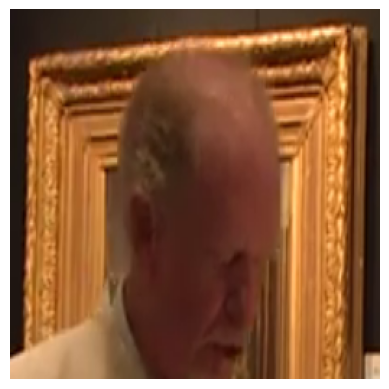

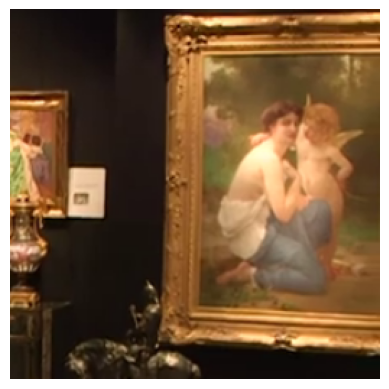

Displaying frame: 11


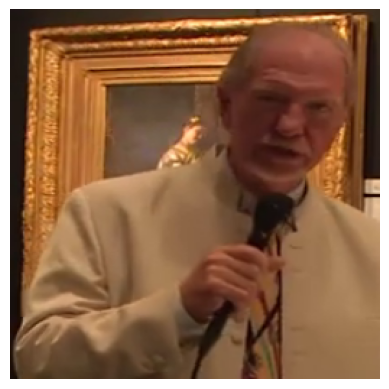

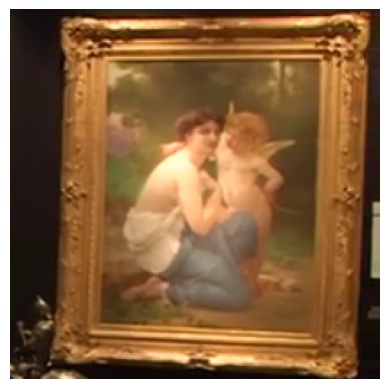

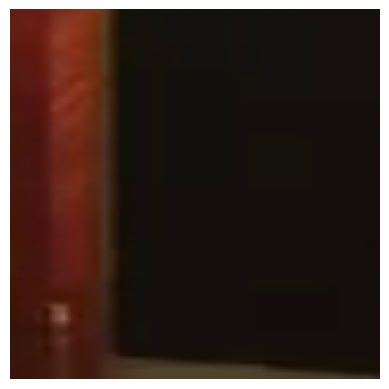

Displaying frame: 12


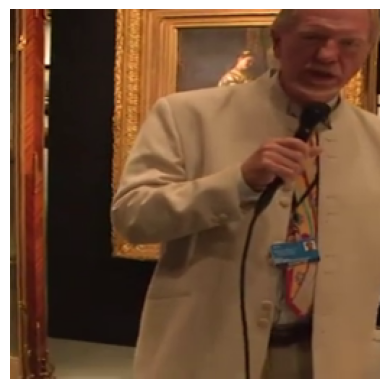

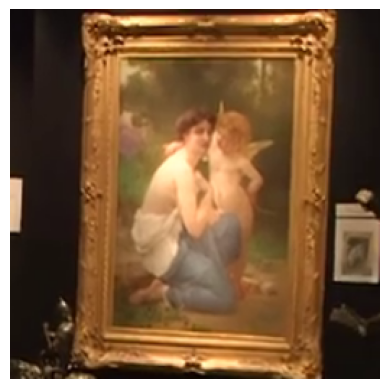

Displaying frame: 13


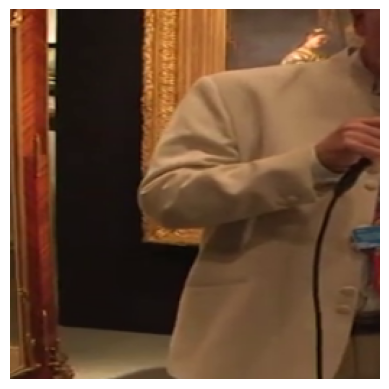

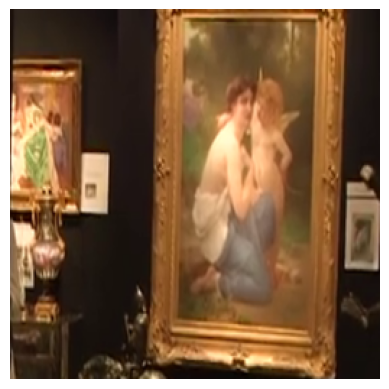

Displaying frame: 14


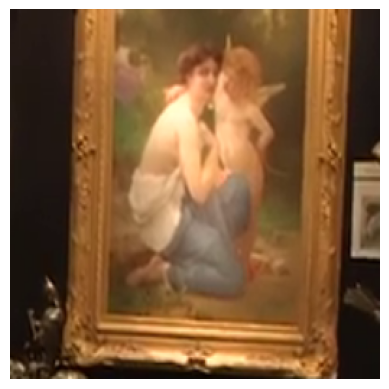

Displaying frame: 15


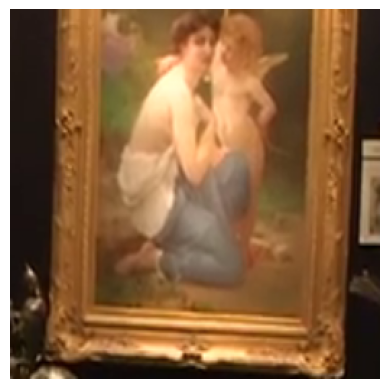

Displaying frame: 16


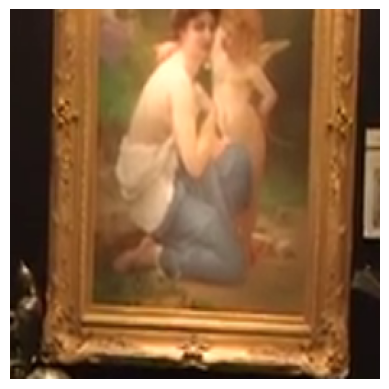

Displaying frame: 17


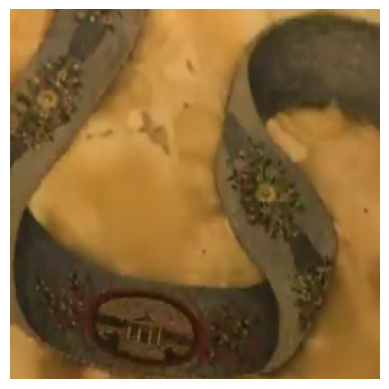

Displaying frame: 18


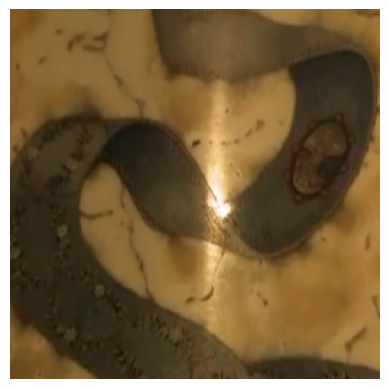

Displaying frame: 19


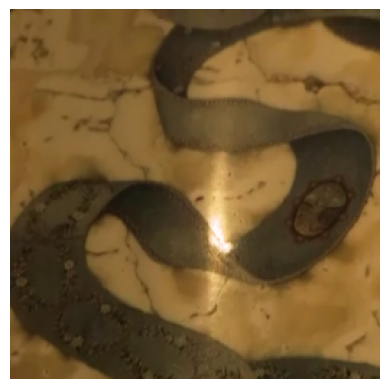

Displaying frame: 20


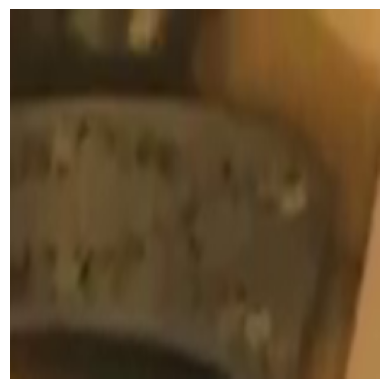

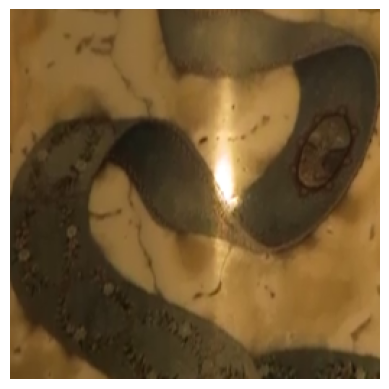

Displaying frame: 21


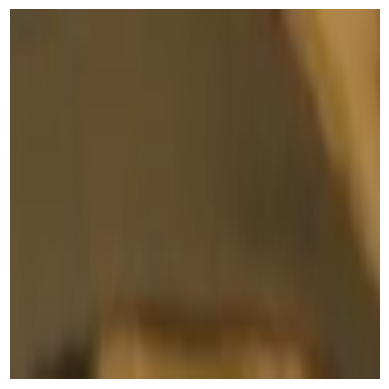

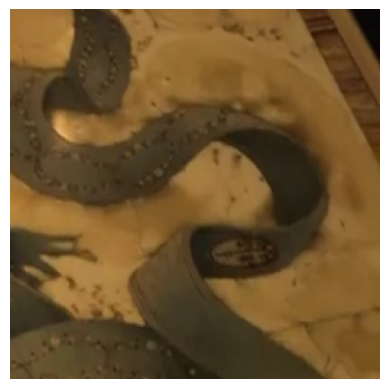

Displaying frame: 22


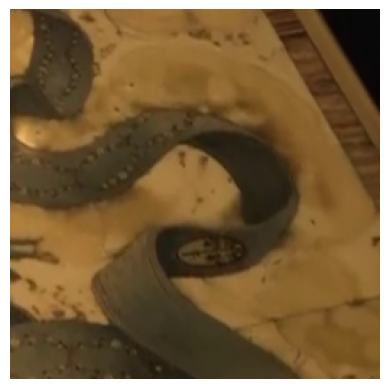

Displaying frame: 23


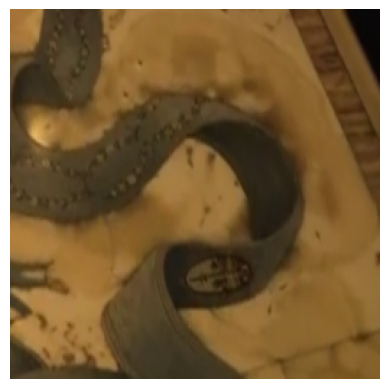

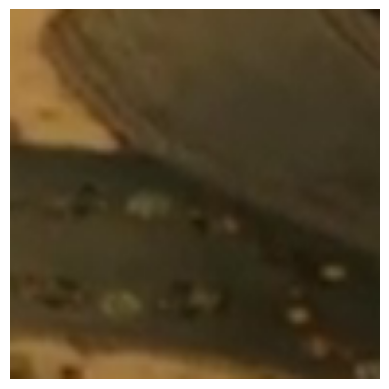

Displaying frame: 24


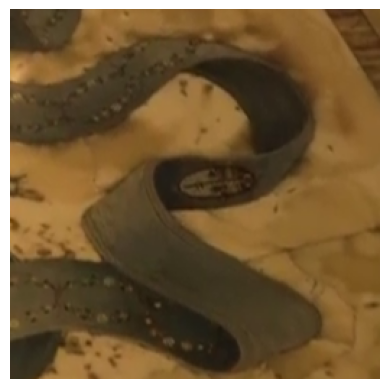

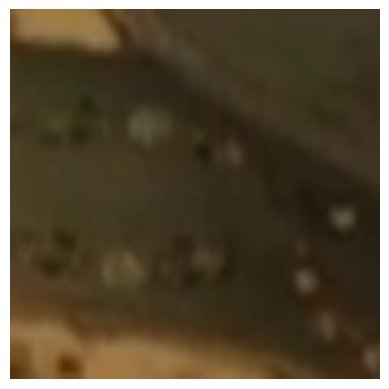

Displaying frame: 25


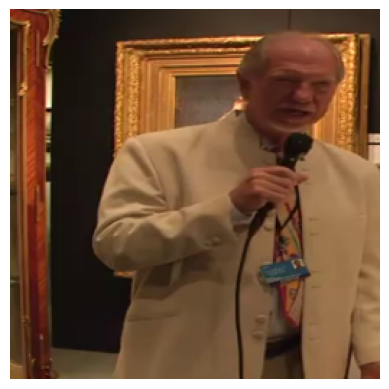

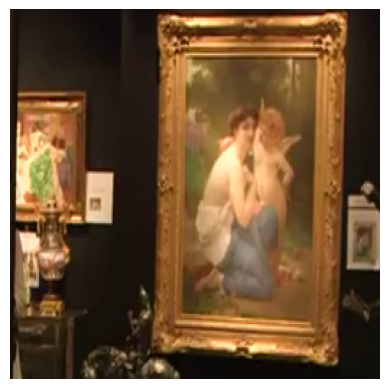

Displaying frame: 26


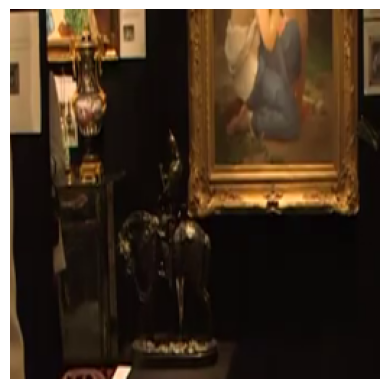

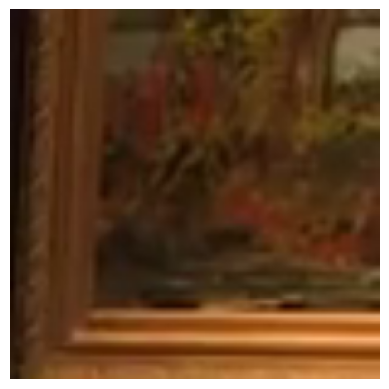

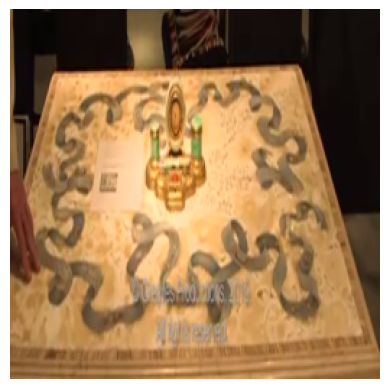

Displaying frame: 27
Displaying frame: 28


In [ ]:
# Display the segments
for i, segment_group in enumerate(all_segments):
    print("Displaying frame: " + str(i))
    for segment in segment_group:
      image_np = segment.permute(1, 2, 0).numpy()
      plt.imshow(image_np)
      plt.axis('off')
      plt.show()

Classify each part into a certain epoch

In [ ]:
# Classification model architecture
class Bottleneck(nn.Module):
    expansion = 4
    def __init__(self, in_channels, out_channels, i_downsample=None, stride=1):
        super(Bottleneck, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0)
        self.batch_norm1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        self.batch_norm2 = nn.BatchNorm2d(out_channels)

        self.conv3 = nn.Conv2d(out_channels, out_channels*self.expansion, kernel_size=1, stride=1, padding=0)
        self.batch_norm3 = nn.BatchNorm2d(out_channels*self.expansion)

        self.i_downsample = i_downsample
        self.stride = stride
        self.relu = nn.ReLU()

    def forward(self, x):
        identity = x.clone()
        x = self.relu(self.batch_norm1(self.conv1(x)))

        x = self.relu(self.batch_norm2(self.conv2(x)))

        x = self.conv3(x)
        x = self.batch_norm3(x)

        #downsample if needed
        if self.i_downsample is not None:
            identity = self.i_downsample(identity)
        #add identity
        x+=identity
        x=self.relu(x)

        return x

class ResNet(nn.Module):
    def __init__(self, ResBlock, layer_list, num_classes, num_channels=3):
        super(ResNet, self).__init__()
        self.in_channels = 64

        self.conv1 = nn.Conv2d(num_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.batch_norm1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(kernel_size = 3, stride=2, padding=1)

        self.layer1 = self._make_layer(ResBlock, layer_list[0], planes=64)
        self.layer2 = self._make_layer(ResBlock, layer_list[1], planes=128, stride=2)
        self.layer3 = self._make_layer(ResBlock, layer_list[2], planes=256, stride=2)
        self.layer4 = self._make_layer(ResBlock, layer_list[3], planes=512, stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(512*ResBlock.expansion, num_classes)

    def forward(self, x):
        x = self.relu(self.batch_norm1(self.conv1(x)))
        x = self.max_pool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)
        x = self.fc(x)

        return x

    def _make_layer(self, ResBlock, blocks, planes, stride=1):
        ii_downsample = None
        layers = []

        if stride != 1 or self.in_channels != planes*ResBlock.expansion:
            ii_downsample = nn.Sequential(
                nn.Conv2d(self.in_channels, planes*ResBlock.expansion, kernel_size=1, stride=stride),
                nn.BatchNorm2d(planes*ResBlock.expansion)
            )

        layers.append(ResBlock(self.in_channels, planes, i_downsample=ii_downsample, stride=stride))
        self.in_channels = planes*ResBlock.expansion

        for i in range(blocks-1):
            layers.append(ResBlock(self.in_channels, planes))

        return nn.Sequential(*layers)



def ResNet50(num_classes, channels=3):
    return ResNet(Bottleneck, [3,4,6,3], num_classes, channels)

In [ ]:
classes = [
    "Art nouveau",
    "Baroque",
    "Expressionism",
    "Impressionism",
    "Post impressionism",
    "Realism",
    "Renaissance",
    "Romanticism",
    "Surrealism",
    "Ukiyo e"
    ]

classification_model_path = "/content/drive/MyDrive/checkpointsStyles/best_model.pth"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
classification_model = ResNet50(10, 3).to(device)

classification_model.load_state_dict(torch.load(classification_model_path, map_location=device))
classification_model.eval()

classification_transform = transforms.Compose([
    transforms.Resize((224, 224))
])

In [ ]:
# Classify the image
frame_classifications = []
for segment_group in all_segments:
  with torch.no_grad():
    if len(segment_group) == 0:
      frame_classifications.append(torch.empty(0))
      continue
    segment_group = classification_transform(segment_group)
    output = classification_model(segment_group.to(device))
    classification = torch.sigmoid(output).cpu().detach()
    classification = torch.argmax(classification, dim=1)
    frame_classifications.append(classification)
    print(str(classification))
print(frame_classifications)

tensor([1])
tensor([1])
tensor([7])
tensor([7])
tensor([1])
tensor([7, 7])
tensor([7, 7])
tensor([8, 1])
tensor([2])
tensor([8, 1])
tensor([8, 1])
tensor([8, 7, 8])
tensor([8, 7])
tensor([8, 7])
tensor([7])
tensor([7])
tensor([1])
tensor([8])
tensor([3])
tensor([3])
tensor([8, 3])
tensor([8, 3])
tensor([3])
tensor([5, 8])
tensor([3, 8])
tensor([8, 1])
tensor([6, 8, 4])
[tensor([1]), tensor([1]), tensor([7]), tensor([7]), tensor([1]), tensor([7, 7]), tensor([7, 7]), tensor([8, 1]), tensor([2]), tensor([8, 1]), tensor([8, 1]), tensor([8, 7, 8]), tensor([8, 7]), tensor([8, 7]), tensor([7]), tensor([7]), tensor([1]), tensor([8]), tensor([3]), tensor([3]), tensor([8, 3]), tensor([8, 3]), tensor([3]), tensor([5, 8]), tensor([3, 8]), tensor([8, 1]), tensor([6, 8, 4]), tensor([]), tensor([])]


In [ ]:
# Print the determined classes

for i, classifications in enumerate(frame_classifications):
  print("Frame: " + str(i) + ":")
  for classification in classifications:
    print(classes[classification.item()])

Frame: 0:
Baroque
Frame: 1:
Baroque
Frame: 2:
Romanticism
Frame: 3:
Romanticism
Frame: 4:
Baroque
Frame: 5:
Romanticism
Romanticism
Frame: 6:
Romanticism
Romanticism
Frame: 7:
Surrealism
Baroque
Frame: 8:
Expressionism
Frame: 9:
Surrealism
Baroque
Frame: 10:
Surrealism
Baroque
Frame: 11:
Surrealism
Romanticism
Surrealism
Frame: 12:
Surrealism
Romanticism
Frame: 13:
Surrealism
Romanticism
Frame: 14:
Romanticism
Frame: 15:
Romanticism
Frame: 16:
Baroque
Frame: 17:
Surrealism
Frame: 18:
Impressionism
Frame: 19:
Impressionism
Frame: 20:
Surrealism
Impressionism
Frame: 21:
Surrealism
Impressionism
Frame: 22:
Impressionism
Frame: 23:
Realism
Surrealism
Frame: 24:
Impressionism
Surrealism
Frame: 25:
Surrealism
Baroque
Frame: 26:
Renaissance
Surrealism
Post impressionism
Frame: 27:
Frame: 28:


Alter the video to showcase the model predictions

In [ ]:
# Load the video
# clip = VideoFileClip(video_path)
clip = VideoFileClip(video_path)
fps = clip.fps
duration = clip.duration

# Define timestamps and texts
texts = [[classes[classNr] for classNr in classification.tolist()] for classification in frame_classifications]
text_durations = [time_b - time_a for time_a, time_b in zip(timestamps, timestamps[1:])]
if len(text_durations) > 0:
  text_durations.append(duration - text_durations[-1])
else:
  text_durations.append(duration)

# Prepare the output video
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_path = "output_with_text.mp4"
out = cv2.VideoWriter(output_path, fourcc, fps, (clip.w, clip.h))

# Process each frame
for t in np.arange(0, duration, 1/fps):
    frame = clip.get_frame(t)
    frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

    # Add text overlays at specified timestamps
    for frame_painting_coordinates, frame_text, timestamp, pred, text_duration in zip(all_painting_coordinates, texts, timestamps, preds, text_durations):
        overlay = pred.cpu().numpy().squeeze(0)
        if timestamp <= t < timestamp + text_duration:
          overlay = cv2.resize(overlay, (frame.shape[1], frame.shape[0]))
          overlay = overlay[:, :, np.newaxis]
          color = np.array([30,255,100], dtype=np.uint8)
          frame = ((overlay / 2) * color + (1 - (overlay / 2)) * frame).astype(np.uint8)

          for painting_coordinate, text in zip(frame_painting_coordinates, frame_text):
            x, y, w, h = painting_coordinate
            cv2.putText(frame, text, (max(x, 20), max(y, 20)), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,20,147), 2, cv2.LINE_AA)

    # Write the frame to the output video
    out.write(frame)

# Release the video writer and close
out.release()

# Download the result
files.download(output_path)

  warnings.warn("Warning: in file %s, "%(self.filename)+



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>